In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv(r'C:\Users\RAJAT DEVARAKONDA\Desktop\projects\Predicting-whether-client-subscribed-a-term-deposit-master\bank-full.csv',sep=';')

In [3]:
df.shape 

(45211, 17)

In [4]:
df.head() #lets see the data 

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [6]:
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [7]:
#bal is in -ve and +ve including 0
#duration and previous has zero values but  completly makes sense and cannot consider as missing values
# campaign atleast once the customer was already contacted during this campaing year 
#min age is 18 year eliglible for opting the term plan
#day will not make sense as it implies which day cust was last contacted

In [8]:
#null values
df.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [9]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'y'],
      dtype='object')

In [10]:
#rename the col to more meaningful 
df.columns = ['age', 'job', 'marital', 'education', 'default_credit', 'balance', 'house_loan',
       'personal_loan', 'contact_type', 'day_ofweek', 'month', 'duration', 'current_campaign_contact_count', 'days_passed',
       "previous_coutact_count",'previous_campaing_outcome','deposit']

In [11]:
df.head()

,age,job,marital,education,default_credit,balance,house_loan,personal_loan,contact_type,day_ofweek,month,duration,current_campaign_contact_count,days_passed,previous_coutact_count,previous_campaing_outcome,deposit
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [12]:
#lets see the cat features
df_cat = df.select_dtypes(include='O')

In [13]:
df_cat.head()

,job,marital,education,default_credit,house_loan,personal_loan,contact_type,month,previous_campaing_outcome,deposit
0,management,married,tertiary,no,yes,no,unknown,may,unknown,no
1,technician,single,secondary,no,yes,no,unknown,may,unknown,no
2,entrepreneur,married,secondary,no,yes,yes,unknown,may,unknown,no
3,blue-collar,married,unknown,no,yes,no,unknown,may,unknown,no
4,unknown,single,unknown,no,no,no,unknown,may,unknown,no


In [14]:
#lets count the unique values in each col

df_cat.nunique()

job                          12
marital                       3
education                     4
default_credit                2
house_loan                    2
personal_loan                 2
contact_type                  3
month                        12
previous_campaing_outcome     4
deposit                       2
dtype: int64

In [15]:
#univariate analysis

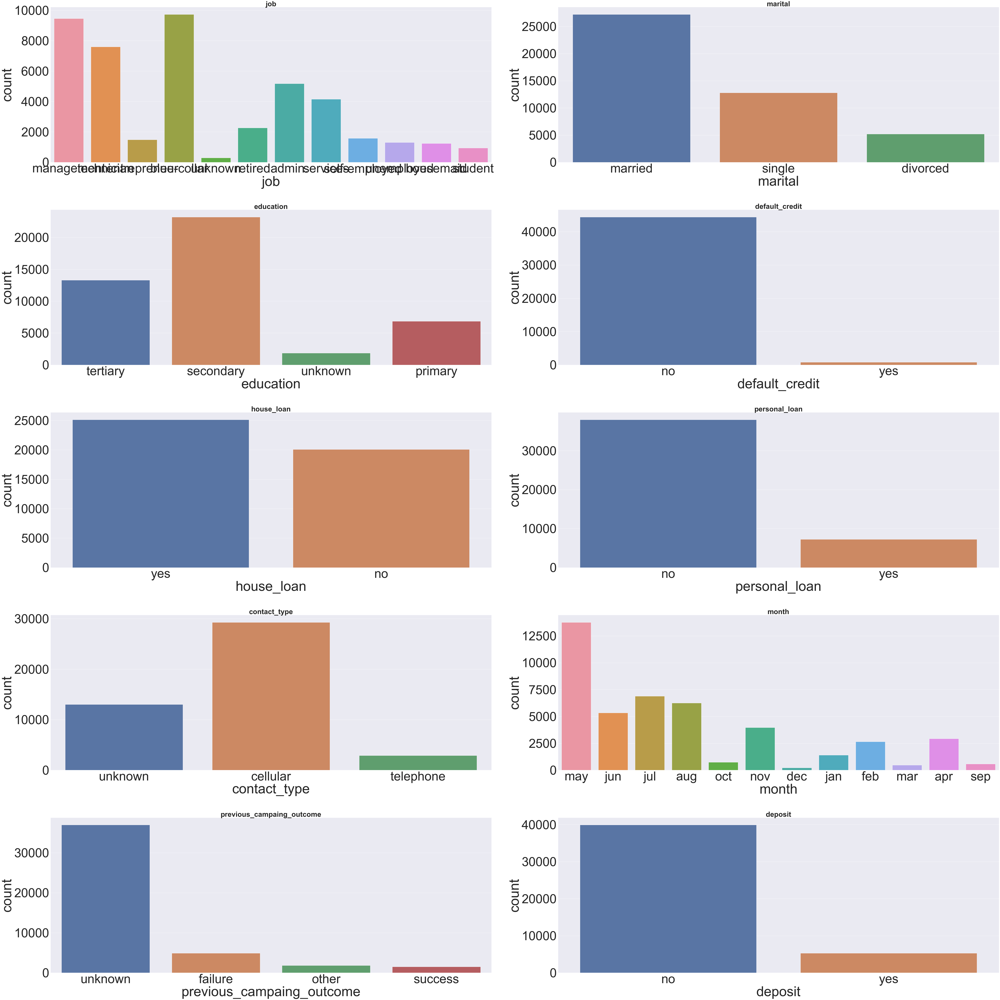

In [16]:
#lets see each cat feature 

pos =1
plt.figure(figsize=(100,100))

for i in df_cat.columns:
    sns.set(font_scale = 8)
    plt.subplot(5,2,pos)
    sns.countplot(df[i])
    plt.title(i,fontweight="bold",fontsize=50) 
    pos +=1
    plt.tight_layout()

In [17]:
df['job'].unique()
label =['management', 'technician', 'entrepreneur', 'blue-collar',
       'unknown', 'retired', 'admin.', 'services', 'self-employed',
       'unemployed', 'housemaid', 'student']

In [18]:
#5k opted for term deposit
# more cust were contact in may from last contact month of year 
#mostly contacted by calls
#very less customer with default credit 



([<matplotlib.patches.Wedge at 0x20e431d64c0>,
 [Text(1.0295005475373984, 0.8261529051090949, 'management'),
  Text(-0.5609461927232866, 1.1948804830899404, 'technician'),
  Text(-1.3181305635704446, -0.07022689927273205, 'entrepreneur'),
  Text(-0.7780491158187768, -1.0663205772063202, 'blue-collar'),
  Text(0.03205778496521757, -1.8197176424992763, 'unknown'),
  Text(0.8138266515539203, -1.6279085297462308, 'retired'),
  Text(0.8808823087887092, -0.9830800364482404, 'admin.'),
  Text(1.0688290112672745, -0.7745996028100071, 'services'),
  Text(1.1980380857373174, -0.5541703214020619, 'self-employed'),
  Text(2.2440706867798648, -0.5886822171047346, 'unemployed'),
  Text(1.3127019592481248, -0.13861300871900314, 'housemaid'),
  Text(2.3195354436829634, -0.04642548328750051, 'student')],
 [Text(0.5615457532022172, 0.45062885733223357, '21.53'),
  Text(-0.3059706505763381, 0.6517529907763311, '20.92'),
  Text(-0.7189803074020606, -0.03830558142149021, '16.80'),
  Text(-0.424390426810241

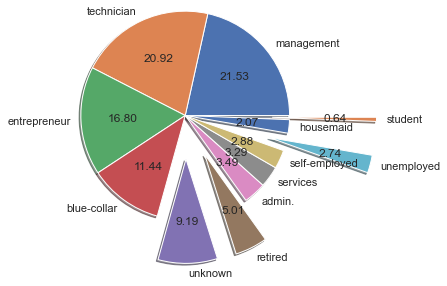

In [19]:
sns.set(font_scale = 1)
plt.pie(df['job'].value_counts(),autopct='%.2f',radius=1.2,explode=[0,0,0,0,0.5,0.5,0,0,0,1,0,1],shadow=True,labels=label)

In [20]:
#~18% of customer exploded in above are student and others not working currently

In [21]:
df['deposit'].value_counts()

no     39922
yes     5289
Name: deposit, dtype: int64

In [22]:
df[df['deposit']=='yes'].shape[0]*100/df['deposit'].shape[0]
#12 % customer has opted for the term deposit in current campain

11.698480458295547

In [23]:
# lets analyse continous features
df_num = df.select_dtypes(exclude='O')

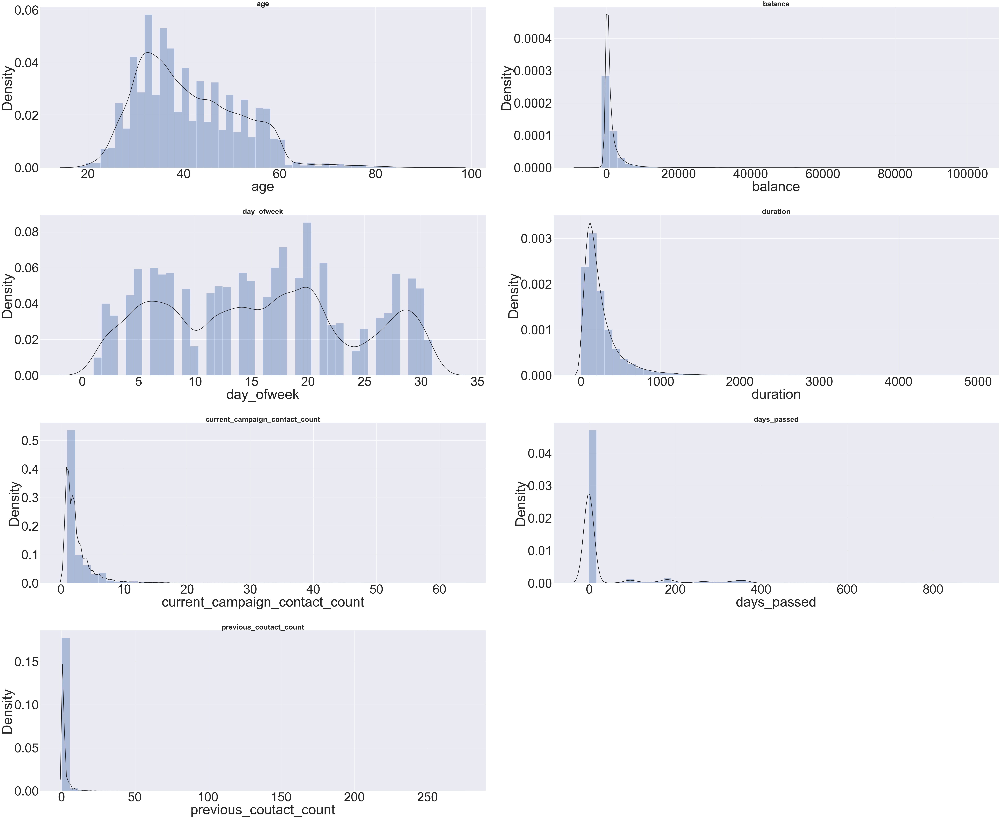

In [24]:
pos =1
plt.figure(figsize=(100,100))

for i in df_num.columns:
    sns.set(font_scale = 8)
    plt.subplot(5,2,pos)
    sns.distplot(df[i], kde_kws={"color": "k", "lw": 3, "label": "KDE"})
    plt.title(i,fontweight="bold",fontsize=50) 
    pos +=1
    plt.tight_layout()

Text(0.5, 1.0, 'duration')

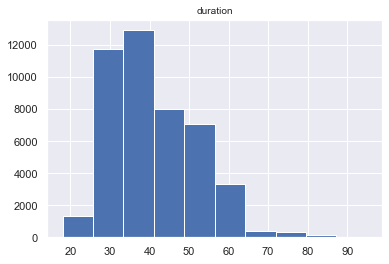

In [25]:
#atleast 5 times custoemr were contacted in current_campaign_contact_count
#atmax 25 times custoemr were contacted in prevoius_campaign
#age 30-40 has more cust 
#Durartion and days passed are near to normal distrubution
sns.set(font_scale = 1)
plt.hist(df['age'])
plt.title('duration',fontsize=10)

Text(0.5, 1.0, 'duration')

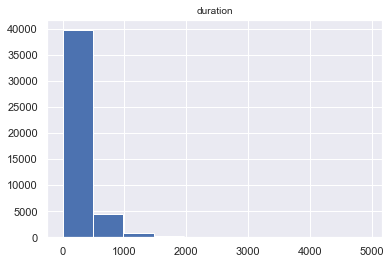

In [26]:
sns.set(font_scale = 1)
plt.hist(df['duration'])
plt.title('duration',fontsize=10)
#duration is mostly to make next call is under 500days

Text(0.5, 1.0, 'days_passed')

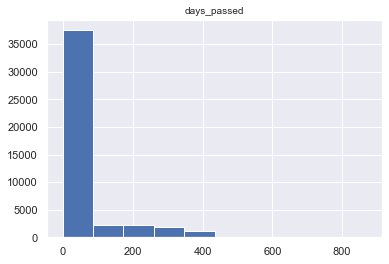

In [27]:
sns.set(font_scale = 1)
plt.hist(df['days_passed'])
plt.title('days_passed',fontsize=10)
#50-100 days passed after last call made from a previous campaign

In [28]:
pd.crosstab(df['month'],df['deposit']).apply(lambda x:x/x.sum()*100)

deposit,no,yes
month,,
apr,5.899003,10.909435
aug,13.924653,13.008130
dec,0.285557,1.890717
feb,5.530785,8.338060
jan,3.158659,2.684818
jul,15.700616,11.854793
jun,12.010921,10.323313
mar,0.573619,4.688977
may,32.165222,17.489128


Index(['apr', 'aug', 'dec', 'feb', 'jan', 'jul', 'jun', 'mar', 'may', 'nov',
       'oct', 'sep'],
      dtype='object', name='month')


Text(0.5, 1.0, 'No of targted cust/month')

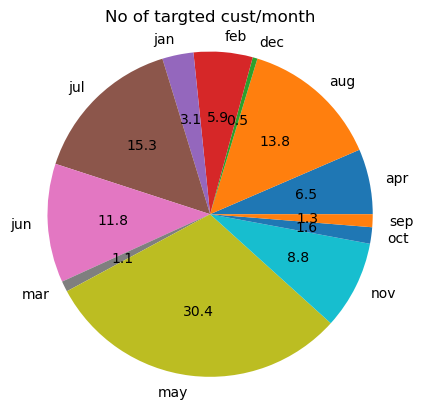

In [29]:

nodep = pd.crosstab(df['deposit'],df['month']).iloc[0]
dep = pd.crosstab(df['deposit'],df['month']).iloc[1]
tot = nodep+dep
print(tot.index)
labels = ['apr', 'aug', 'dec', 'feb', 'jan', 'jul', 'jun', 'mar', 'may', 'nov','oct', 'sep']
plt.rcdefaults()
plt.pie(tot,labels=labels,autopct='%.1f',radius=1.1,)
plt.title('No of targted cust/month')

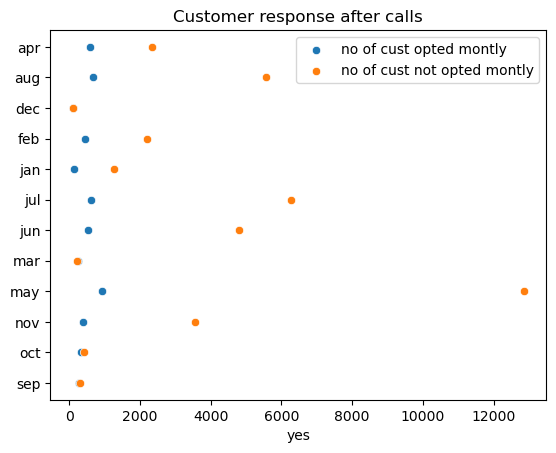

In [30]:
sns.scatterplot(dep,labels)
sns.scatterplot(nodep,labels)
plt.title('Customer response after calls')
legend=['no of cust opted montly','no of cust not opted montly']
plt.legend(legend)

In [31]:
#effectiveness
effc= pd.crosstab(df['month'],df['deposit'])
effc['diff'] = effc['yes']-effc['no']
effc['tot'] = effc['no']+effc['yes']
effc['effective'] = round(effc['diff']/effc['tot'] *100,2)
effc


deposit,no,yes,diff,tot,effective
month,,,,,
apr,2355,577,-1778,2932,-60.64
aug,5559,688,-4871,6247,-77.97
dec,114,100,-14,214,-6.54
feb,2208,441,-1767,2649,-66.70
jan,1261,142,-1119,1403,-79.76
jul,6268,627,-5641,6895,-81.81
jun,4795,546,-4249,5341,-79.55
mar,229,248,19,477,3.98
may,12841,925,-11916,13766,-86.56


In [32]:
!pip install plotly

In [33]:

import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
# Add data

ratio = effc['effective']

line = go.Scatter(
    x = effc.index,
    y = effc['effective'],
    text = '(%)',
    fill = 'tonexty',
    mode = 'lines',
    name='Effectiveness Ratio',
    line = dict(
        color = ('#ff3300'),
        width= 4,
        dash = 'dot',
    
    )

)

data = [line]

layout = dict(title='Effectiveness per Month',
             xaxis=dict(title='Month'),
              yaxis=dict(title='Effectiveness ratio')
             )

fig = dict(data=data, layout=layout)
iplot(fig)

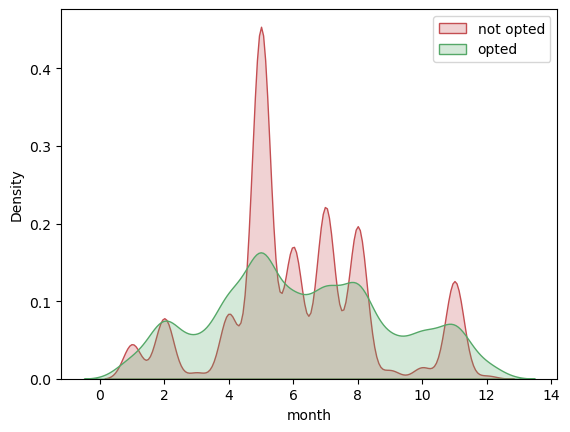

In [34]:
plt.rcdefaults()
data = df.copy()
data['deposit'].replace({'yes':1,'no':0},inplace=True)
data['month'].replace({'jan':1, 'feb':2, 'mar':3, 'apr':4, 'may':5, 'jun':6, 'jul':7, 'aug':8, 'sep':9, 'oct':10, 'nov':11, 'dec':12},inplace=True)
sns.kdeplot(data[data['deposit']== 0]['month'],color='r',label='not opted',shade=True)
sns.kdeplot(data[data['deposit']== 1]['month'],color='g',label='opted',shade=True)
plt.legend()

In [35]:
#Bivariate analysis
pos =1
plt.figure(figsize=(100,100))

for i in df_cat.columns:
    sns.set(font_scale = 8)
    plt.subplot(5,2,pos)
    sns.countplot(df[i],hue=df['deposit'])
    plt.title(i,fontweight="bold",fontsize=50)
    pos +=1
    plt.tight_layout()

<Figure size 5000x5000 with 0 Axes>

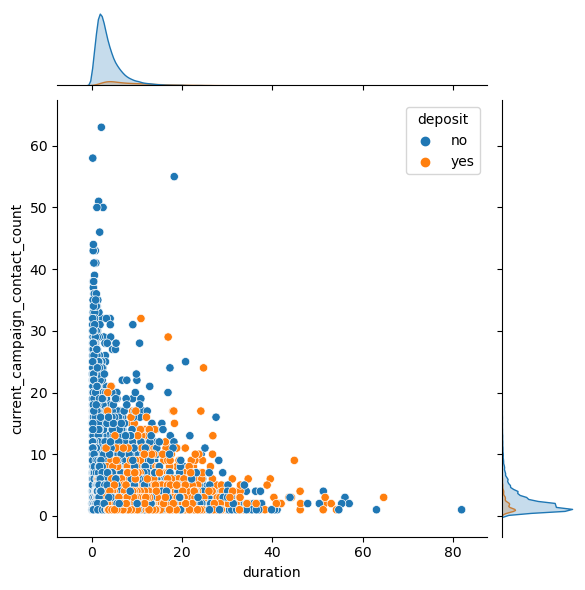

In [36]:
plt.rcdefaults()
plt.figure(figsize=(50,50))
sns.jointplot(df['duration']/60,df['current_campaign_contact_count'],data=df,hue=df['deposit'])

#AFter 10 call the customers are lossing interest in opting the plan

In [37]:
df.head()
pd.crosstab(df['deposit'], df['current_campaign_contact_count']).apply(lambda x: x/x.sum() * 100).iloc[:,:5]
#campaiGn wise sucessrate

current_campaign_contact_count,1,2,3,4,5
deposit,,,,,
no,85.402417,88.796481,88.806376,90.999432,92.120181
yes,14.597583,11.203519,11.193624,9.000568,7.879819


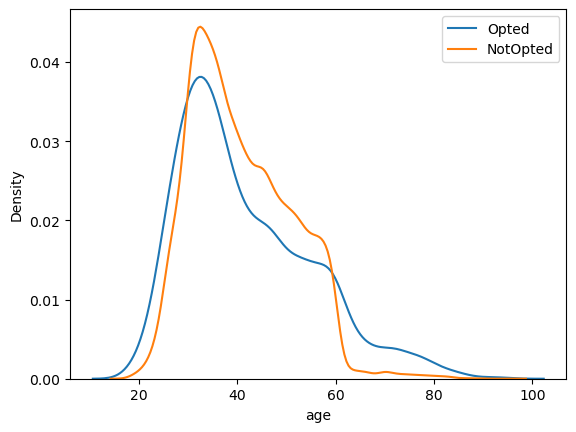

In [38]:
plt.rcdefaults()
data = df.copy()
data['deposit'].replace({'no':0,'yes':1},inplace=True)
sns.kdeplot(data[data['deposit']==1]['age'])
sns.kdeplot(data[data['deposit']==0]['age'])

label = ['Opted','NotOpted']
plt.legend(label)

In [39]:
lst = [df]
for column in lst:
    column.loc[column["age"] < 30,  "age_cat"] = 20
    column.loc[(column["age"] >= 30) & (column["age"] <= 39), "age_cat"] = 30
    column.loc[(column["age"] >= 40) & (column["age"] <= 49), "age_cat"] = 40
    column.loc[(column["age"] >= 50) & (column["age"] <= 59), "age_cat"] = 50
    column.loc[column["age"] >= 60, "age_cat"] = 60
df['age_cat'] = df['age_cat'].astype(np.int64)

In [40]:
#df.drop('age_cat',axis=1,inplace=True)
df.head()

,age,job,marital,education,default_credit,balance,house_loan,personal_loan,contact_type,day_ofweek,month,duration,current_campaign_contact_count,days_passed,previous_coutact_count,previous_campaing_outcome,deposit,age_cat
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,50
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no,40
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no,30
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no,40
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no,30


<AxesSubplot:xlabel='age_cat', ylabel='count'>

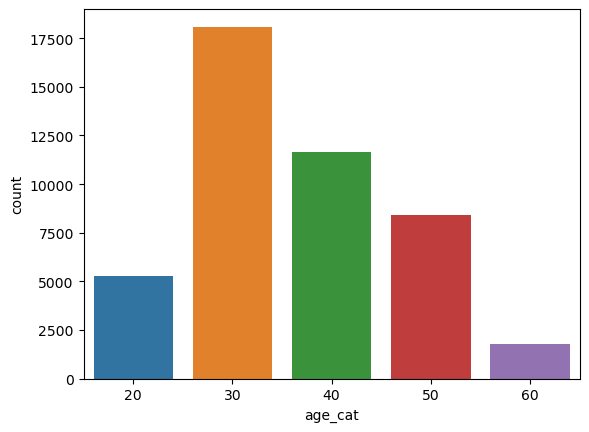

In [41]:
plt.rcdefaults()
sns.countplot(df['age_cat'])

<AxesSubplot:xlabel='age_cat', ylabel='count'>

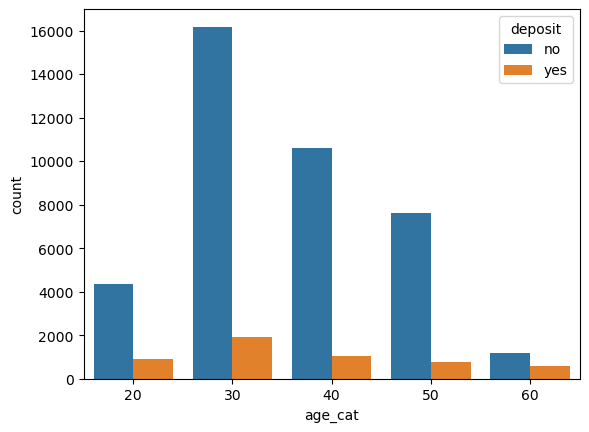

In [42]:
plt.rcdefaults()
sns.countplot(df['age_cat'],hue=df['deposit'])

In [43]:
pd.crosstab(df['deposit'],df['age_cat'],).apply(lambda x:x/x.sum()*100)

age_cat,20,30,40,50,60
deposit,,,,,
no,82.40091,89.424512,90.879451,90.665874,66.367713
yes,17.59909,10.575488,9.120549,9.334126,33.632287


In [44]:
pd.crosstab(df['deposit'],df['job'],).apply(lambda x:x/x.sum()*100)

job,admin.,blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown
deposit,,,,,,,,,,,,
no,87.797331,92.725031,91.728312,91.209677,86.244449,77.208481,88.157061,91.116996,71.321962,88.943004,84.497314,88.194444
yes,12.202669,7.274969,8.271688,8.790323,13.755551,22.791519,11.842939,8.883004,28.678038,11.056996,15.502686,11.805556


In [45]:
#Pre-Processing
#lets try to handle the Unknown cases

In [46]:
for i in df_cat:
    print(i,'--->',df[i].unique())
    print('*'*50)

job ---> ['management' 'technician' 'entrepreneur' 'blue-collar' 'unknown'
 'retired' 'admin.' 'services' 'self-employed' 'unemployed' 'housemaid'
 'student']
**************************************************
marital ---> ['married' 'single' 'divorced']
**************************************************
education ---> ['tertiary' 'secondary' 'unknown' 'primary']
**************************************************
default_credit ---> ['no' 'yes']
**************************************************
house_loan ---> ['yes' 'no']
**************************************************
personal_loan ---> ['no' 'yes']
**************************************************
contact_type ---> ['unknown' 'cellular' 'telephone']
**************************************************
month ---> ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'jan' 'feb' 'mar' 'apr' 'sep']
**************************************************
previous_campaing_outcome ---> ['unknown' 'failure' 'other' 'success']
*************************

In [47]:
# we have unknown values in previous_campaing_outcome,job,education

In [48]:
df.groupby('education')['job'].agg([pd.Series.mode])

,mode
education,
primary,blue-collar
secondary,blue-collar
tertiary,management
unknown,blue-collar


In [49]:
#lets fill the unkown cases in job  with mode of the education

In [50]:
#lets fill the unkown cases in job  with mode of the education
def Impute(df):
    job = df[0]
    edu = df[1]
    
    if job == 'unknown':
        if edu == 'tertiary': return 'management'
        else: return 'blue-collar'
    else:
        return job

# job Impute
df['job'] = df[['job' , 'education']].apply(Impute, axis = 1)

In [51]:
df.groupby('job')['education'].agg([pd.Series.mode])

,mode
job,
admin.,secondary
blue-collar,secondary
entrepreneur,tertiary
housemaid,primary
management,tertiary
retired,secondary
self-employed,tertiary
services,secondary
student,secondary


In [52]:
#lets fill the unkown cases in job  with mode of the education
def Impute(df):
    job = df[1]
    edu = df[0]
    
    if edu == 'unknown':
        if job == 'housemaid': return 'primary'
        elif job == 'entrepreneur' or 'self-employed' or 'management': return 'tertiary'
        else: return 'secondary'
    else:
        return edu

# job Impute
df['education'] = df[[ 'education','job' ]].apply(Impute, axis = 1)

In [53]:
df['previous_campaing_outcome'].value_counts()

unknown    36959
failure     4901
other       1840
success     1511
Name: previous_campaing_outcome, dtype: int64

In [54]:
df.groupby('deposit')['previous_campaing_outcome'].count()

deposit
no     39922
yes     5289
Name: previous_campaing_outcome, dtype: int64

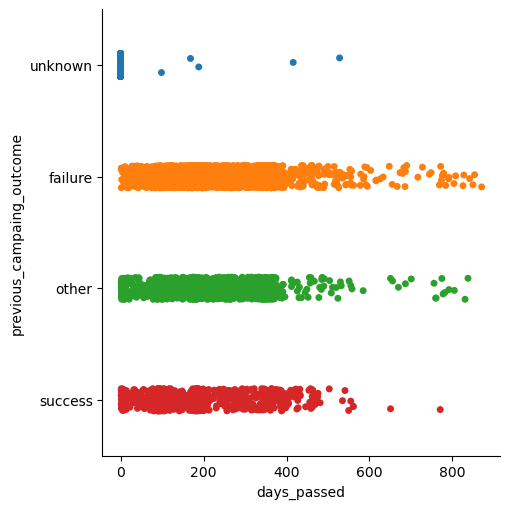

In [55]:
sns.reset_defaults()
sns.catplot(df['days_passed'],df['previous_campaing_outcome'],data=df,kind='strip')

In [56]:
# for unknown cases days passed is mostly same value ...lets see what is it

In [57]:
pd.crosstab(index=df['previous_campaing_outcome'],columns=df['days_passed'])

days_passed,-1,1,2,3,4,5,6,7,8,9,...,805,808,826,828,831,838,842,850,854,871
previous_campaing_outcome,,,,,,,,,,,,,,,,,,,,,
failure,0,3,1,0,1,1,1,1,2,0,...,0,1,1,1,0,0,1,1,1,1
other,0,3,35,1,0,9,7,5,23,10,...,1,0,0,0,1,1,0,0,0,0
success,0,9,1,0,1,1,2,1,0,2,...,0,0,0,0,0,0,0,0,0,0
unknown,36954,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [58]:
#so the value is '-1' which means that previously customer was not contacted 
#lets mark these values as nonexistent

In [59]:
df['previous_campaing_outcome'].replace('unknown','nonexistent',inplace=True)

In [60]:
df['previous_campaing_outcome'].value_counts()

nonexistent    36959
failure         4901
other           1840
success         1511
Name: previous_campaing_outcome, dtype: int64

In [61]:
df.drop('age_cat',axis=1,inplace=True)
df.head()

,age,job,marital,education,default_credit,balance,house_loan,personal_loan,contact_type,day_ofweek,month,duration,current_campaign_contact_count,days_passed,previous_coutact_count,previous_campaing_outcome,deposit
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,nonexistent,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,nonexistent,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,nonexistent,no
3,47,blue-collar,married,tertiary,no,1506,yes,no,unknown,5,may,92,1,-1,0,nonexistent,no
4,33,blue-collar,single,tertiary,no,1,no,no,unknown,5,may,198,1,-1,0,nonexistent,no


In [62]:
df['contact_type'].value_counts()

cellular     29285
unknown      13020
telephone     2906
Name: contact_type, dtype: int64

In [63]:
#Lets impute unknown as non-call medium of contact
df['contact_type'].replace('unknown','non-call',inplace=True)

In [64]:
#correlation

In [65]:
corr = df.corr()

<function matplotlib.pyplot.title(label, fontdict=None, loc=None, pad=None, *, y=None, **kwargs)>

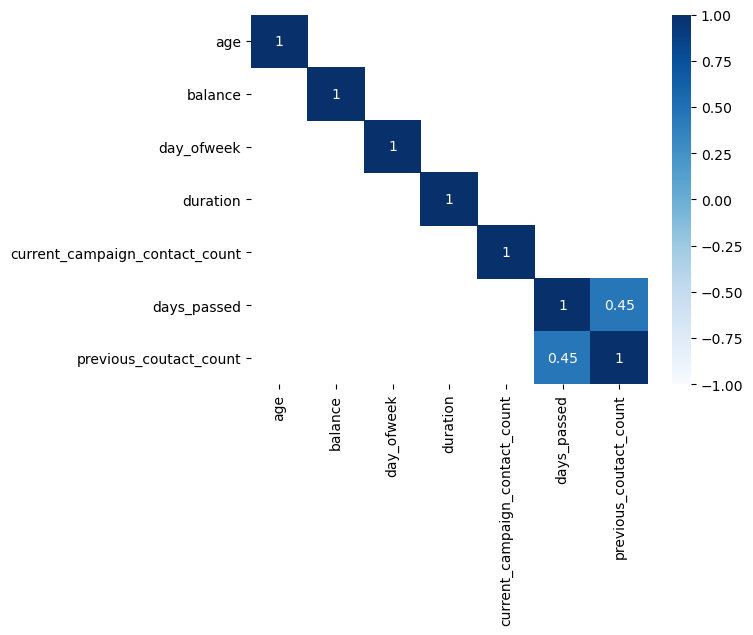

In [66]:
sns.reset_defaults()
sns.heatmap(corr[(corr>0.3)|(corr<-0.3)],vmax=1,vmin=-1,cmap='Blues',annot=True)
plt.title

In [67]:
#lets see how the correlation is between days_passed and prevoiusly contacted

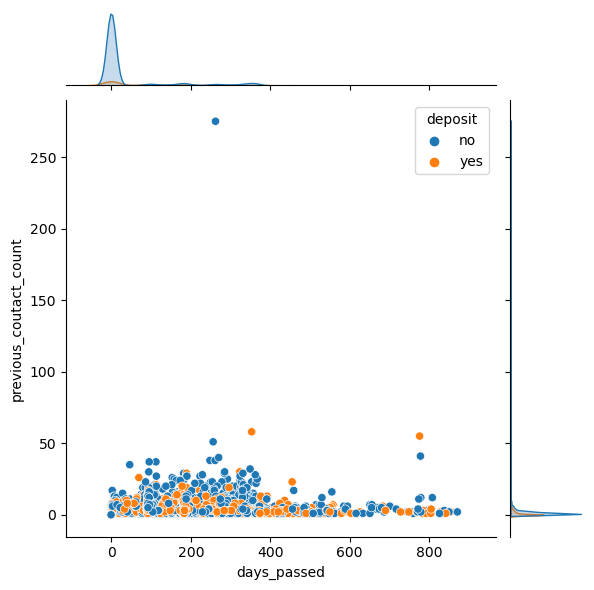

In [68]:
plt.rcdefaults()
sns.jointplot(df['days_passed'],df['previous_coutact_count'],hue=df['deposit'])
#not a linear but somepositive correlation exits

In [69]:
#outliers

In [70]:
pos =1
plt.figure(figsize=(100,100))

for i in df_num.columns:
    sns.set(font_scale = 8)
    plt.subplot(5,2,pos)
    sns.boxplot(y = df[i],)
    plt.title(i,fontweight="bold",fontsize=50) 
    pos +=1
    plt.tight_layout()

In [71]:
#% outliers
data = df_num.copy()
for k, v in data.items():
        q1 = v.quantile(0.25)
        q3 = v.quantile(0.75)
        irq = q3 - q1
        v_col = v[(v <= q1 - 1.5 * irq) | (v >= q3 + 1.5 * irq)]
        perc = np.shape(v_col)[0] * 100.0 / np.shape(data)[0]
        print("Column %s outliers = %.2f%%" % (k, perc))

Column age outliers = 1.08%
Column balance outliers = 10.46%
Column day_ofweek outliers = 0.00%
Column duration outliers = 7.18%
Column current_campaign_contact_count outliers = 9.63%
Column days_passed outliers = 100.00%
Column previous_coutact_count outliers = 100.00%


In [72]:
#days_passed and prevoiusly contacted shows 100% outliers coz of 0 value and -1 value
#seems to be mathamtically outluers

In [73]:
#lets see thhe outliers in age,bal,contact_out

In [74]:
from collections import Counter
def detect_outliers(df,features):
    outlier_indices = []
    
    for c in features:
        #1st quartile
        Q1 = np.percentile(df[c],25)
        #3rd quartile
        Q3 = np.percentile(df[c],75)
        #IQR
        IQR = Q3-Q1
        #Outlier Step
        outlier_step= IQR * 1.5
        #Detect outlier and their indices
        outlier_list_col = df[(df[c]<Q1 - outlier_step) | (df[c]> Q3 + outlier_step)].index
        #store indices
        outlier_indices.extend(outlier_list_col)
        
    outlier_indices = Counter(outlier_indices)
    multiple_outliers = list(i for i,v in outlier_indices.items() if v > 1)
    
    return multiple_outliers
df.loc[detect_outliers(df,["age","balance","duration"])]['age'].min()

22

In [75]:
#sns.boxplot(y = df['balance'])
Q1 = np.percentile(df['age'],25)
        #3rd quartile
Q3 = np.percentile(df['age'],75)
        #IQR
IQR = Q3-Q1
IQR

15.0

In [76]:
a = Q3+1.5*IQR
b = Q1-1.5*IQR
a,b

(70.5, 10.5)

In [77]:
#there are no customner in lower outlier level for age and the customer age above 70.5 are not actually outliers as many of them 
# have opted the term plan so we cannot remove them.


In [78]:
#So in age makes outlier makes sense with lowwer range 

In [79]:
#sns.boxplot(y = df['balance'])
Q1 = np.percentile(df['balance'],25)
        #3rd quartile
Q3 = np.percentile(df['balance'],75)
        #IQR
IQR = Q3-Q1
IQR

1356.0

In [80]:
a = Q3+1.5*IQR
b = Q1-1.5*IQR
a,b

(3462.0, -1962.0)

In [81]:
#balance cannot be consider here as it has -ve values 0 and +ve , so this seems to be debit credit 
#we can drop the balance column 

In [82]:
df.drop('balance',axis=1,inplace=True)

In [83]:
#sns.boxplot(y = df['balance'])
Q1 = np.percentile(df['duration'],25)
        #3rd quartile
Q3 = np.percentile(df['duration'],75)
        #IQR
IQR = Q3-Q1
IQR

216.0

In [84]:
a = Q3+1.5*IQR
b = Q1-1.5*IQR
a,b

(643.0, -221.0)

In [85]:
from collections import Counter
def detect_outliers(df,features):
    outlier_indices = []
    
    for c in features:
        #1st quartile
        Q1 = np.percentile(df[c],25)
        #3rd quartile
        Q3 = np.percentile(df[c],75)
        #IQR
        IQR = Q3-Q1
        #Outlier Step
        outlier_step= IQR * 1.5
        #Detect outlier and their indices
        outlier_list_col = df[(df[c]<Q1 - outlier_step) | (df[c]> Q3 + outlier_step)].index
        #store indices
        outlier_indices.extend(outlier_list_col)
        
    outlier_indices = Counter(outlier_indices)
    multiple_outliers = list(i for i,v in outlier_indices.items() if v > 0)
    
    return multiple_outliers
df.loc[detect_outliers(df,["duration"])][['duration','deposit']]

,duration,deposit
37,1666,no
43,1492,no
53,787,no
59,1778,no
61,812,no
...,...,...
45124,701,yes
45199,1166,no
45200,1556,yes
45206,977,yes


In [86]:
df.loc[detect_outliers(df,["duration"])][['duration','deposit']].max()

duration    4918
deposit      yes
dtype: object

In [87]:
# similar to age in duration there are no actual outliers even though the duration in seconds is high customer have opted the term plan

In [88]:
#multivarite analysis

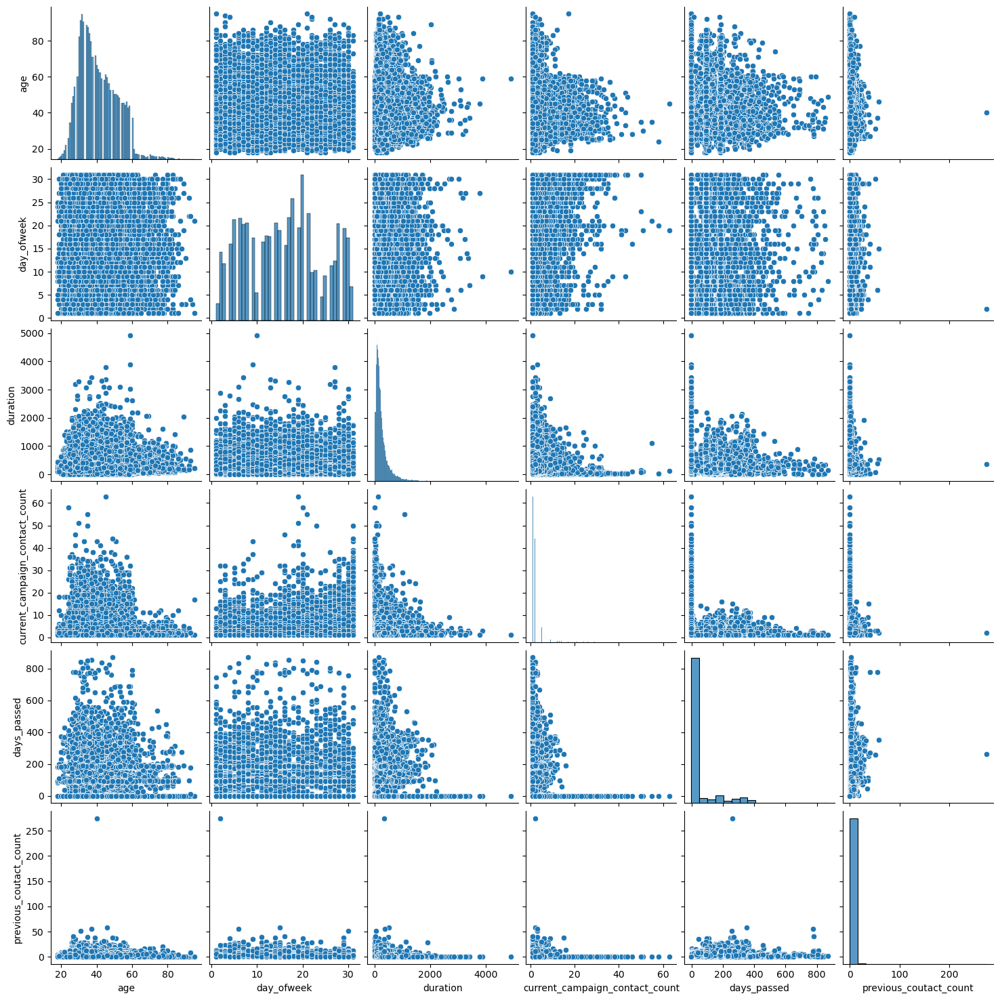

In [89]:
plt.rcdefaults()
sns.pairplot(df)

In [90]:
#no linear relation can be seen between features

In [91]:
#lets encode the catogerical featires

In [92]:
df.head()

,age,job,marital,education,default_credit,house_loan,personal_loan,contact_type,day_ofweek,month,duration,current_campaign_contact_count,days_passed,previous_coutact_count,previous_campaing_outcome,deposit
0,58,management,married,tertiary,no,yes,no,non-call,5,may,261,1,-1,0,nonexistent,no
1,44,technician,single,secondary,no,yes,no,non-call,5,may,151,1,-1,0,nonexistent,no
2,33,entrepreneur,married,secondary,no,yes,yes,non-call,5,may,76,1,-1,0,nonexistent,no
3,47,blue-collar,married,tertiary,no,yes,no,non-call,5,may,92,1,-1,0,nonexistent,no
4,33,blue-collar,single,tertiary,no,no,no,non-call,5,may,198,1,-1,0,nonexistent,no


In [93]:
#All customer are equally important so for banks perpespitive so i label enocde

In [94]:
df = df.join(pd.get_dummies(df['job'],drop_first=True))
df = df.join(pd.get_dummies(df['marital'],drop_first=True))
df = df.join(pd.get_dummies(df['education'],drop_first=True))
df = df.join(pd.get_dummies(df['contact_type'],drop_first=True))
df = df.join(pd.get_dummies(df['month'],drop_first=True))
df = df.join(pd.get_dummies(df['previous_campaing_outcome'],drop_first=True))



In [95]:
df.replace({'yes':1,'no':0},inplace=True)


In [96]:
df.head(1)

,age,job,marital,education,default_credit,house_loan,personal_loan,contact_type,day_ofweek,month,...,jul,jun,mar,may,nov,oct,sep,nonexistent,other,success
0,58,management,married,tertiary,0,1,0,non-call,5,may,...,0,0,0,1,0,0,0,1,0,0


In [97]:

df_cat.columns

Index(['job', 'marital', 'education', 'default_credit', 'house_loan',
       'personal_loan', 'contact_type', 'month', 'previous_campaing_outcome',
       'deposit'],
      dtype='object')

In [98]:
df.drop(['job', 'marital', 'education','contact_type', 'month', 'previous_campaing_outcome'],axis=1,inplace=True)

In [99]:
pd.set_option('display.max_columns',40)
df.head()

,age,default_credit,house_loan,personal_loan,day_ofweek,duration,current_campaign_contact_count,days_passed,previous_coutact_count,deposit,blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,married,single,secondary,tertiary,non-call,telephone,aug,dec,feb,jan,jul,jun,mar,may,nov,oct,sep,nonexistent,other,success
0,58,0,1,0,5,261,1,-1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1,44,0,1,0,5,151,1,-1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
2,33,0,1,1,5,76,1,-1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
3,47,0,1,0,5,92,1,-1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
4,33,0,0,0,5,198,1,-1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0


In [100]:
df = df.drop_duplicates()

In [101]:
x = df.drop('deposit',axis=1)

In [102]:
y = df['deposit']

In [103]:
from sklearn.model_selection import train_test_split

In [104]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.3,random_state=1)

In [105]:
#lets scale using min_max scaler

In [106]:
from sklearn.preprocessing import MinMaxScaler

In [107]:
scl = MinMaxScaler()

In [108]:
scl.fit(xtrain)

MinMaxScaler()

In [109]:
xtrain = pd.DataFrame(scl.transform(xtrain),columns=x.columns)

In [110]:
xtest= pd.DataFrame(scl.transform(xtest),columns=x.columns)

In [111]:
from sklearn.linear_model import LogisticRegression

In [112]:
lr = LogisticRegression()

In [113]:
lr.fit(xtrain,ytrain)

LogisticRegression()

In [114]:
pred = lr.predict(xtest)

In [115]:
lr.score(xtrain,ytrain)

0.9010554923524207

In [116]:
lr.score(xtest,ytest)

0.9030450490304505

In [117]:
from sklearn.metrics import confusion_matrix,accuracy_score,roc_auc_score,roc_curve

In [118]:
cm = confusion_matrix(ytest,pred)
tn, fp, fn, tp = confusion_matrix(ytest,pred).ravel()
lr_recall = round(tp/(tp+fn), 3)   # Of all the people, how many were recognised to opt
lr_precision = round(tp/(tp+fp), 3)  # Of all the people predicted to have opt, how many did have opted
lr_specificity =round(tn/(tn+fp),3)    # Of all the people not opted, how many were recognised to not opted
type_1_error = fp    # People without Chd predicted to have Chd
type_2_error = fn    # People with Chd predicted to have no Chd
lr_recall, lr_precision, lr_specificity, type_1_error, type_2_error

#specificity is good but recall is low


(0.327, 0.657, 0.978, 266, 1049)

<AxesSubplot:>

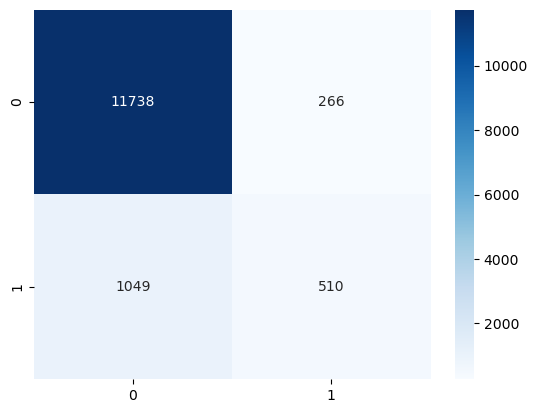

In [119]:
sns.heatmap(cm,annot=True,fmt='.6g',cmap='Blues',)

AUC: 0.903


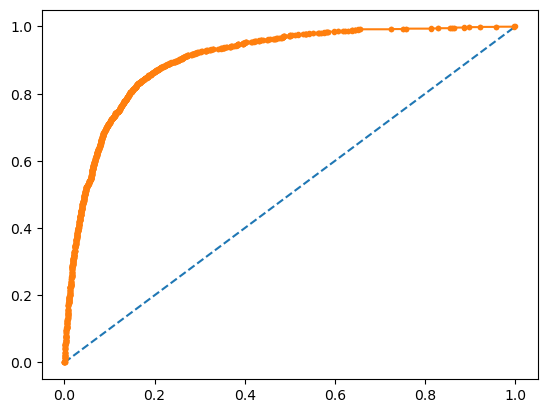

In [120]:
probs = lr.predict_proba(xtest)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(ytest, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
fpr, tpr, thresholds = roc_curve(ytest, probs)
# plot no skill
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

In [121]:
from sklearn.tree import DecisionTreeClassifier

In [122]:
dt = DecisionTreeClassifier(random_state=1)

In [123]:
dt.fit(xtrain,ytrain,)

DecisionTreeClassifier(random_state=1)

In [124]:
pred_dt = dt.predict(xtest)

In [125]:
dt.score(xtrain,ytrain)

1.0

In [126]:
dt.score(xtest,ytest)

0.8794514487945145

In [127]:
#overfitting lets cv


In [128]:
from sklearn.model_selection import cross_val_score
tree_clf = DecisionTreeClassifier()
tree_scores = cross_val_score(tree_clf, xtrain, ytrain, cv=10)
tree_mean = tree_scores.mean()
tree_mean

0.8725506437948246

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold,GridSearchCV
param_dist = {"max_depth": [1,2,3,5,4,6,7,8,9,None],
              "max_features":[1,2,3,5,4,6,7,8,9,None],
              "min_samples_leaf": [1,2,3,5,4,6,7,8,9,None],
              "criterion": ["gini", "entropy"]}
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=DecisionTreeClassifier(), param_grid=param_dist, n_jobs=-1, cv=10, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(x, y)

In [ ]:
grid_result.best_params_

In [ ]:
dt_prun = DecisionTreeClassifier(criterion = 'entropy', max_depth =6,min_samples_leaf = 6)

In [ ]:
dt_prun.fit(xtrain,ytrain)

In [ ]:
pred_prun =  dt.predict(xtest)

In [ ]:
dt_prun.score(xtrain,ytrain) 

In [ ]:
dt_prun.score(xtest,ytest) #Overfitting is reduced

In [ ]:
cm = confusion_matrix(ytest,pred_prun)
tn, fp, fn, tp = confusion_matrix(ytest,pred_prun).ravel()
lr_recall = round(tp/(tp+fn), 3)   # Of all the people, how many were recognised to opt
lr_precision = round(tp/(tp+fp), 3)  # Of all the people predicted to have opt, how many did have opted
lr_specificity =round(tn/(tn+fp),3)    # Of all the people not opted, how many were recognised to not opted
type_1_error = fp    # People without Chd predicted to have Chd
type_2_error = fn    # People with Chd predicted to have no Chd
lr_recall, lr_precision, lr_specificity, type_1_error, type_2_error

In [ ]:
sns.heatmap(cm,annot=True,fmt='.6g',cmap='Blues',)

In [ ]:
#We are missclassifying 788 clients who will potentially opt for the term plan

In [ ]:
probs = dt_prun.predict_proba(xtest)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(ytest, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
fpr, tpr, thresholds = roc_curve(ytest, probs)
# plot no skill
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

In [ ]:


f1_score = 2*(lr_recall*lr_precision)/(lr_recall+lr_precision)
f1_score

In [ ]:
#lets see the best feature
score=dt_prun.feature_importances_
pd.DataFrame(score,index=x.columns,columns=['score']).sort_values('score',ascending=False).head(10).plot.barh()


In [ ]:
df.head()

#Conclusions

We can see that DT is giving best accuracy and less prescision.

I will further try to improve the model using Ensamble methors etc.

We can suggest Bank with below points:

1. In may we can see that most cutomer has opted for as well as they have more rejected.
2. we can request bank to increase the calls or campaign in march august nov and october .
3. Age group 60+ are more likely to opt for the plan,most of the campaign is done in age group 35-40 which is just giving 10% sucess .
4. Also in 20's customer are more focused on future planning so increase the campaing for these customers
5.aFter 10 call the customers are lossing interest in opting the plan, 5-7 calls needs to maximum calls for a clients
6.students and retired people are more likely to opt the plans
7.1st campain is more effective , as campaign increases customer losses intrest
8. 15-25 mins calls are better range of call duration where customer can be convienced.


